In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [2]:
df= pd.read_csv("macro_treasury_full_2000.csv")

In [3]:
df["DATE"] = pd.to_datetime(df["DATE"])
df = df[~df["DATE"].dt.year.isin([2000, 2001])]
df_num= df.drop(columns= "DATE")
print(df)

           DATE  UNRATE  FEDFUNDS    CPI  DGS1MO  DGS3MO  DGS6MO  DGS1  DGS2  \
131  2002-01-01     5.7      1.73  177.7     NaN     NaN     NaN   NaN   NaN   
132  2002-01-02     NaN       NaN    NaN    1.73    1.74    1.85  2.28  3.22   
133  2002-01-03     NaN       NaN    NaN    1.73    1.73    1.82  2.24  3.19   
134  2002-01-04     NaN       NaN    NaN    1.72    1.72    1.82  2.25  3.19   
135  2002-01-07     NaN       NaN    NaN    1.70    1.68    1.77  2.19  3.08   
...         ...     ...       ...    ...     ...     ...     ...   ...   ...   
6390 2025-09-05     NaN       NaN    NaN    4.29    4.07    3.85  3.65  3.51   
6391 2025-09-08     NaN       NaN    NaN    4.26    4.10    3.84  3.64  3.49   
6392 2025-09-09     NaN       NaN    NaN    4.25    4.10    3.85  3.68  3.54   
6393 2025-09-10     NaN       NaN    NaN    4.23    4.09    3.83  3.66  3.54   
6394 2025-09-11     NaN       NaN    NaN    4.22    4.08    3.82  3.63  3.52   

      DGS3  DGS5  DGS7  DGS10  DGS20  D

In [4]:

df_num.describe()

,UNRATE,FEDFUNDS,CPI,DGS1MO,DGS3MO,DGS6MO,DGS1,DGS2,DGS3,DGS5,DGS7,DGS10,DGS20,DGS30
count,284.000000,284.000000,284.000000,5928.000000,5928.000000,5928.000000,5928.000000,5928.000000,5928.000000,5928.000000,5928.000000,5928.000000,5928.000000,5928.000000
mean,5.765845,1.721972,237.152570,1.619126,1.683072,1.779067,1.848551,2.008915,2.182362,2.544771,2.851834,3.126346,3.646763,3.746159
std,1.986793,1.847986,38.212514,1.835926,1.848932,1.838604,1.752615,1.591517,1.477092,1.316308,1.221536,1.163538,1.183005,1.086581
min,3.400000,0.050000,177.700000,0.000000,0.000000,0.020000,0.040000,0.090000,0.100000,0.190000,0.360000,0.520000,0.870000,0.990000
25%,4.200000,0.140000,211.257000,0.070000,0.100000,0.150000,0.250000,0.590000,0.920000,1.497500,1.890000,2.160000,2.650000,2.920000
50%,5.200000,1.030000,233.884500,0.940000,1.000000,1.130000,1.300000,1.600000,1.790000,2.420000,2.830000,3.070000,3.780000,3.805000
75%,6.700000,2.615000,256.033000,2.480000,2.760000,3.092500,3.190000,3.380000,3.590000,3.730000,3.930000,4.180000,4.700000,4.660000
max,14.800000,5.330000,323.364000,6.020000,5.630000,5.610000,5.490000,5.290000,5.260000,5.230000,5.290000,5.440000,6.050000,5.920000


In [5]:
df['day']=df["DATE"].dt.day
df['month']=df['DATE'].dt.month
df['year']=df["DATE"].dt.year
print(df)

           DATE  UNRATE  FEDFUNDS    CPI  DGS1MO  DGS3MO  DGS6MO  DGS1  DGS2  \
131  2002-01-01     5.7      1.73  177.7     NaN     NaN     NaN   NaN   NaN   
132  2002-01-02     NaN       NaN    NaN    1.73    1.74    1.85  2.28  3.22   
133  2002-01-03     NaN       NaN    NaN    1.73    1.73    1.82  2.24  3.19   
134  2002-01-04     NaN       NaN    NaN    1.72    1.72    1.82  2.25  3.19   
135  2002-01-07     NaN       NaN    NaN    1.70    1.68    1.77  2.19  3.08   
...         ...     ...       ...    ...     ...     ...     ...   ...   ...   
6390 2025-09-05     NaN       NaN    NaN    4.29    4.07    3.85  3.65  3.51   
6391 2025-09-08     NaN       NaN    NaN    4.26    4.10    3.84  3.64  3.49   
6392 2025-09-09     NaN       NaN    NaN    4.25    4.10    3.85  3.68  3.54   
6393 2025-09-10     NaN       NaN    NaN    4.23    4.09    3.83  3.66  3.54   
6394 2025-09-11     NaN       NaN    NaN    4.22    4.08    3.82  3.63  3.52   

      DGS3  DGS5  DGS7  DGS10  DGS20  D

In [6]:
grouped_means = df.groupby("year").mean(numeric_only=True)
grouped_means= grouped_means.drop(columns=["day","month"])
print(grouped_means)

        UNRATE  FEDFUNDS         CPI    DGS1MO    DGS3MO    DGS6MO      DGS1  \
year                                                                           
2002  5.783333  1.666667  179.866667  1.629800  1.635320  1.716480  2.001880   
2003  5.991667  1.127500  184.000000  1.019280  1.028040  1.075160  1.241400   
2004  5.541667  1.349167  188.908333  1.269800  1.398720  1.613720  1.887680   
2005  5.083333  3.213333  195.266667  2.999600  3.216120  3.502080  3.620960   
2006  4.608333  4.964167  201.558333  4.752320  4.851560  4.995080  4.936240   
2007  4.616667  5.019167  207.344167  4.408805  4.480956  4.615578  4.531235   
2008  5.800000  1.927500  215.254250  1.293147  1.396853  1.660080  1.826813   
2009  9.283333  0.160000  214.564667  0.096360  0.150920  0.282720  0.473520   
2010  9.608333  0.175000  218.076167  0.114542  0.138446  0.196773  0.317649   
2011  8.933333  0.101667  224.923000  0.039600  0.052840  0.095720  0.180880   
2012  8.075000  0.140000  229.586083  0.

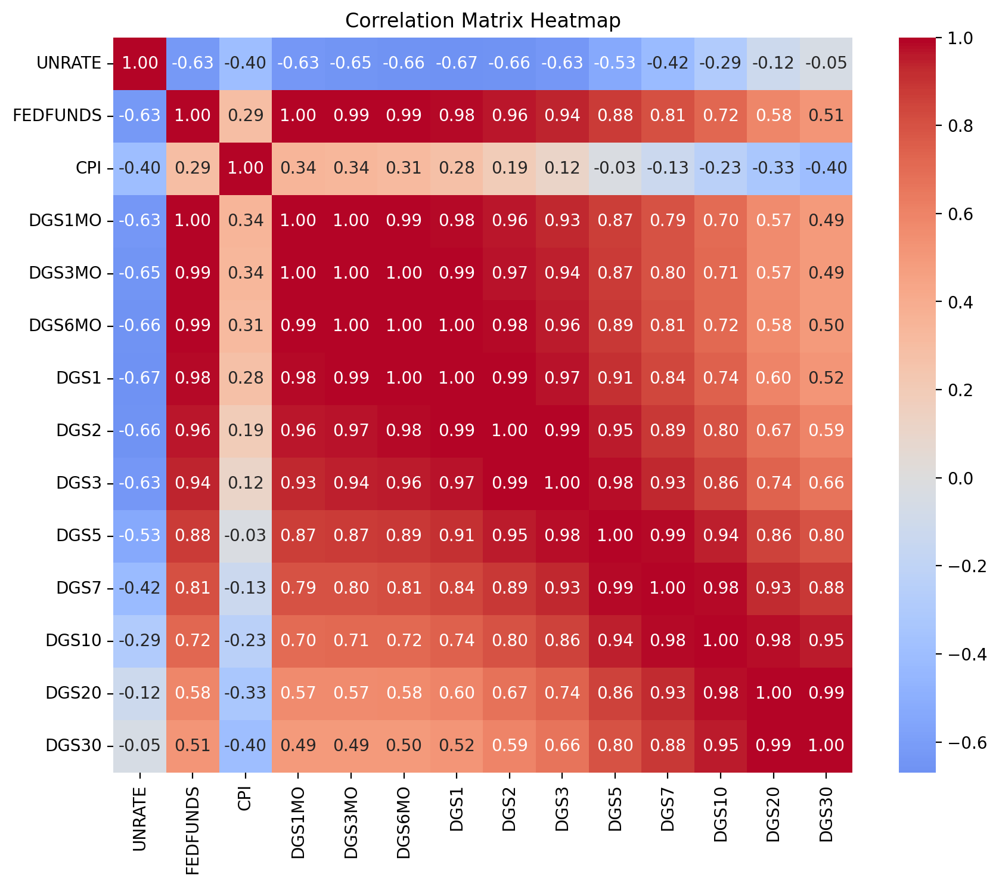

In [7]:
corr = grouped_means.corr()

plt.figure(figsize=(10, 8), dpi = 200)
sns.heatmap(
    corr,
    annot=True,       
    cmap="coolwarm",  
    center=0,          
    fmt=".2f"         
)
plt.title("Correlation Matrix Heatmap")
plt.show()

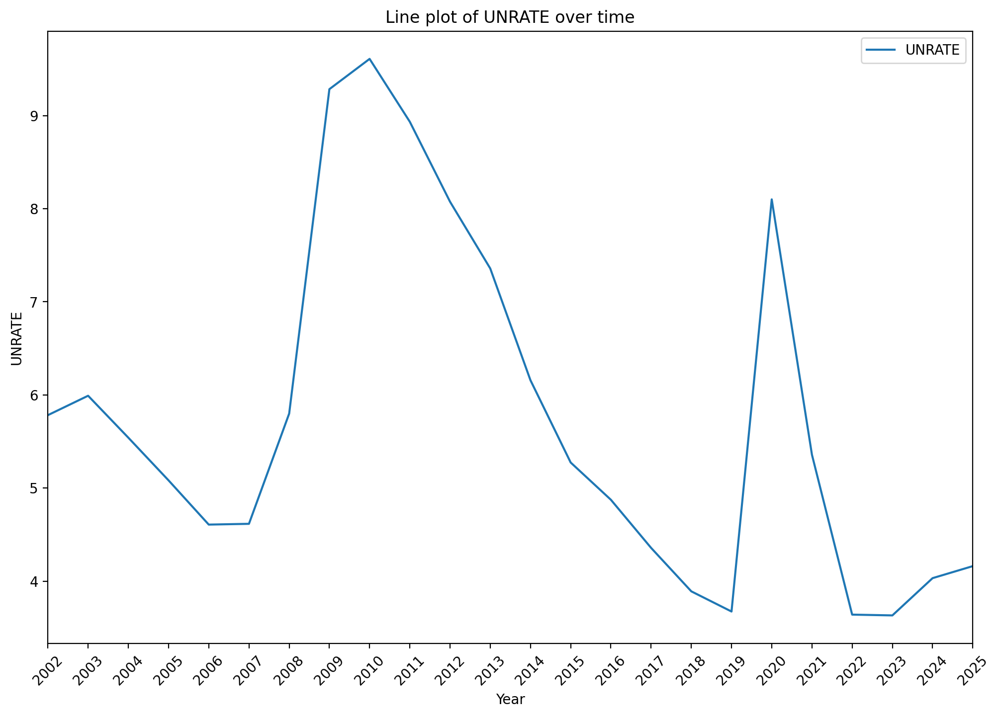

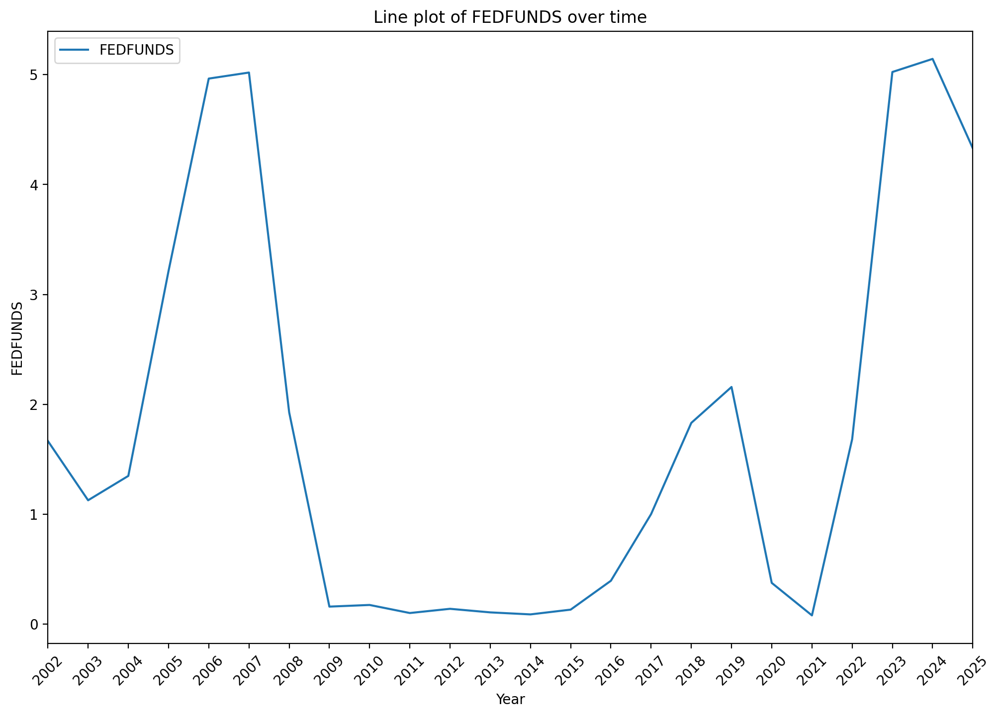

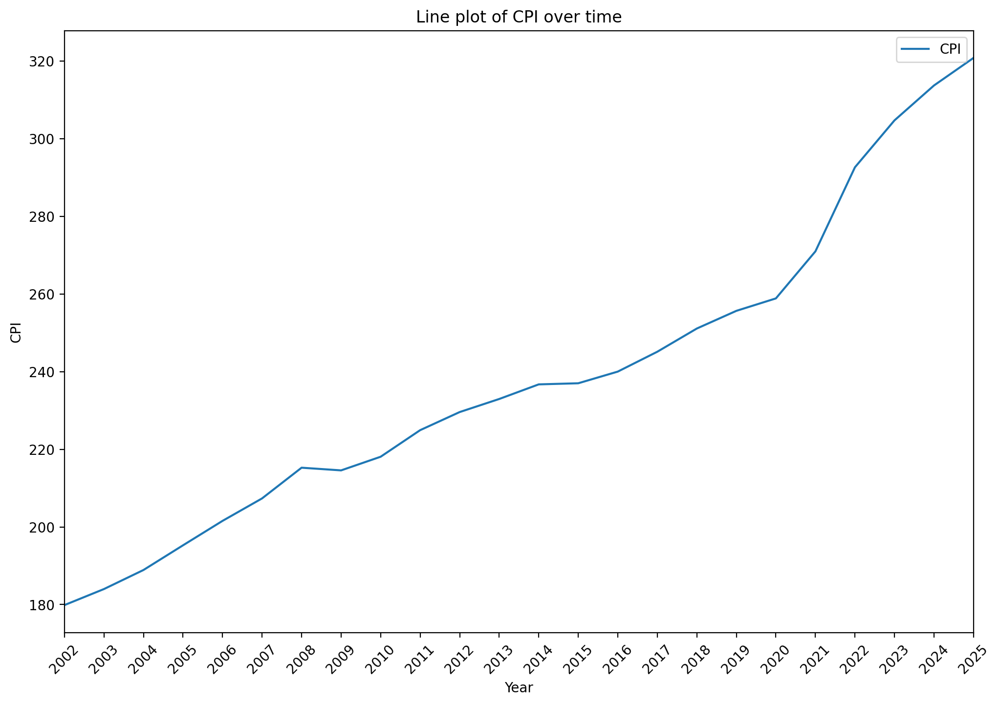

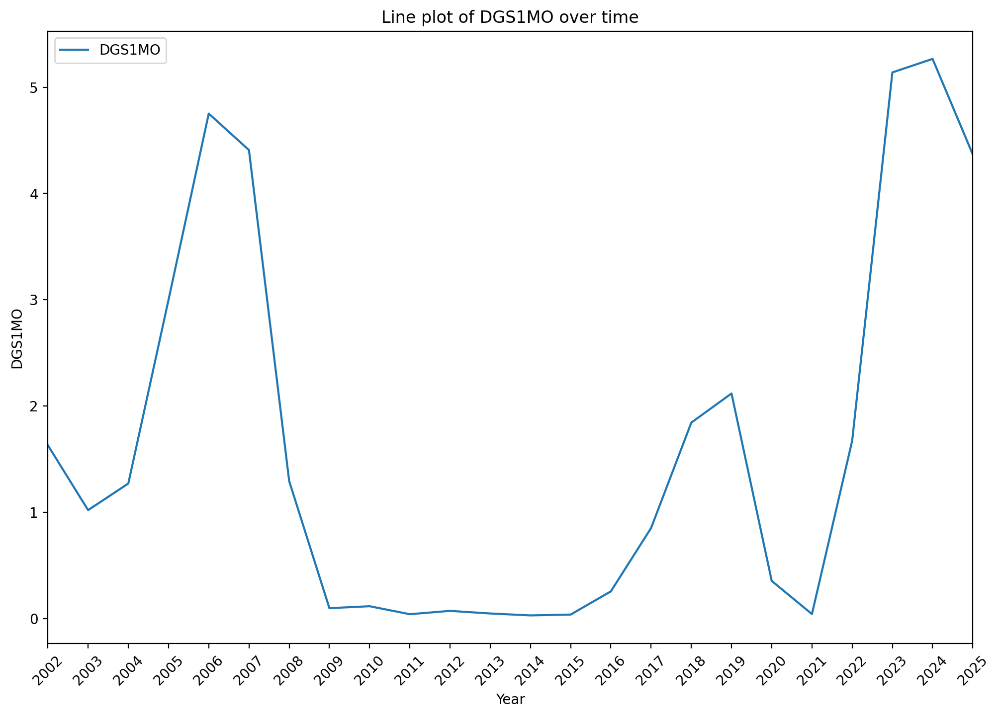

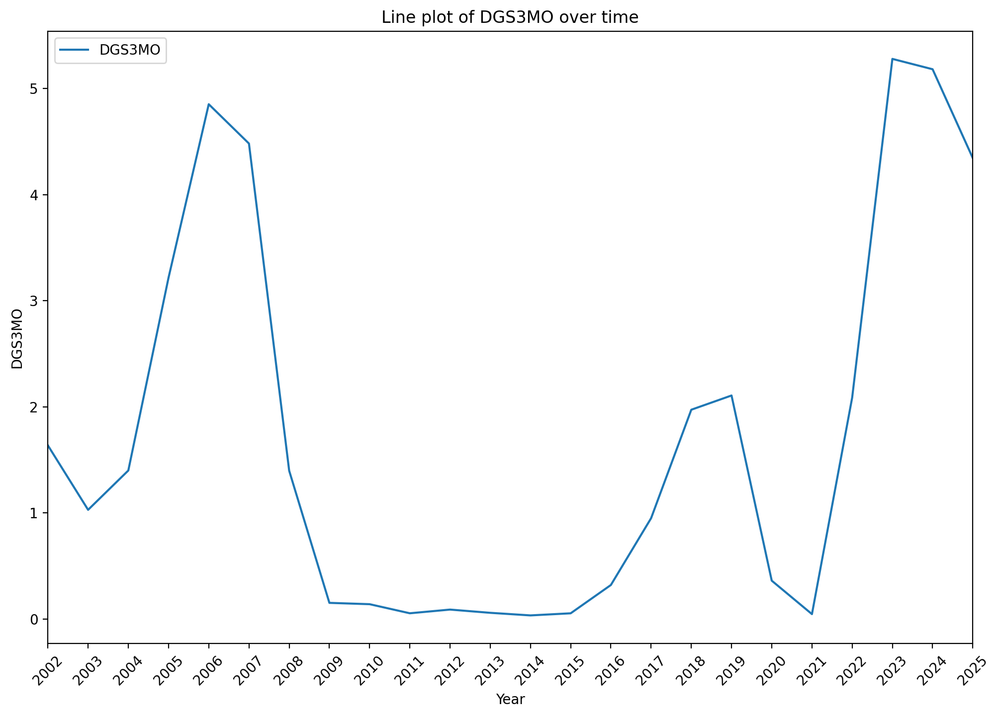

...

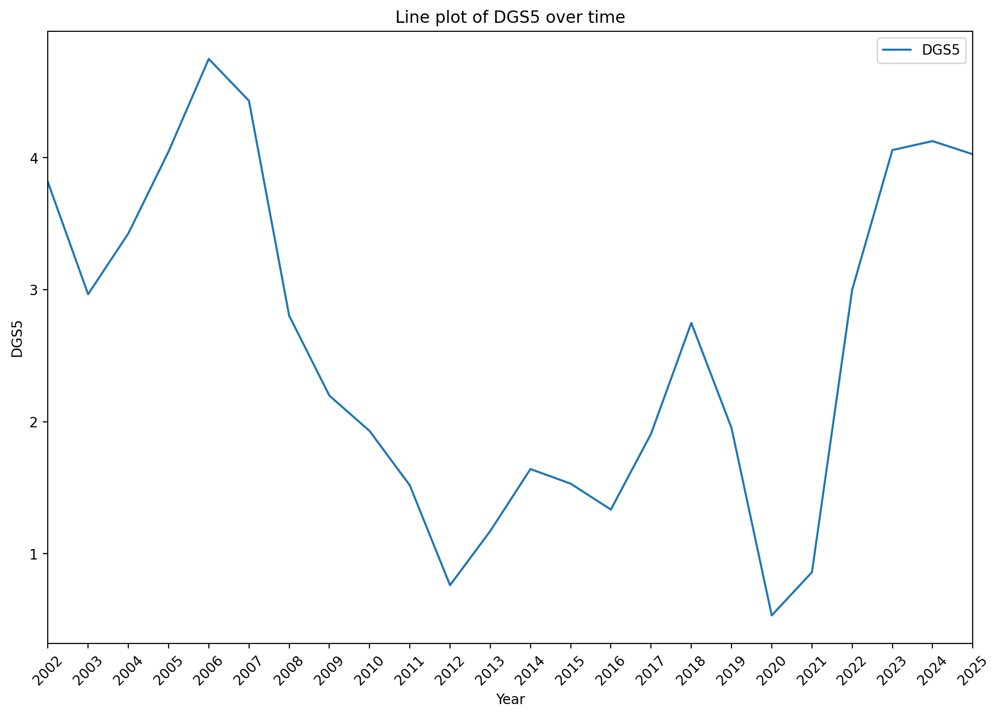

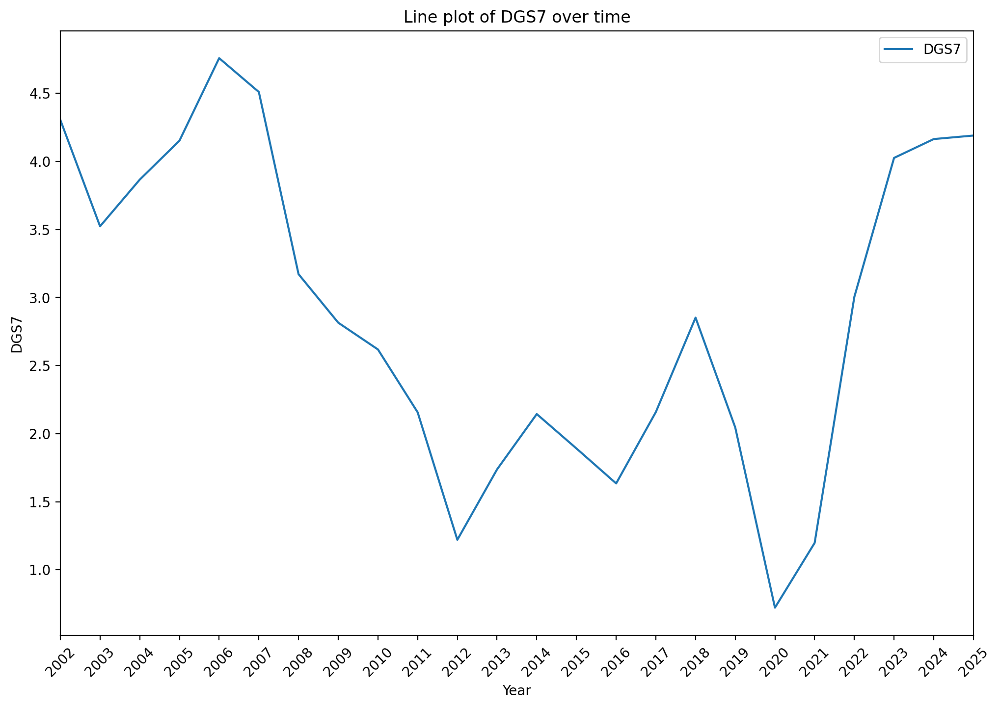

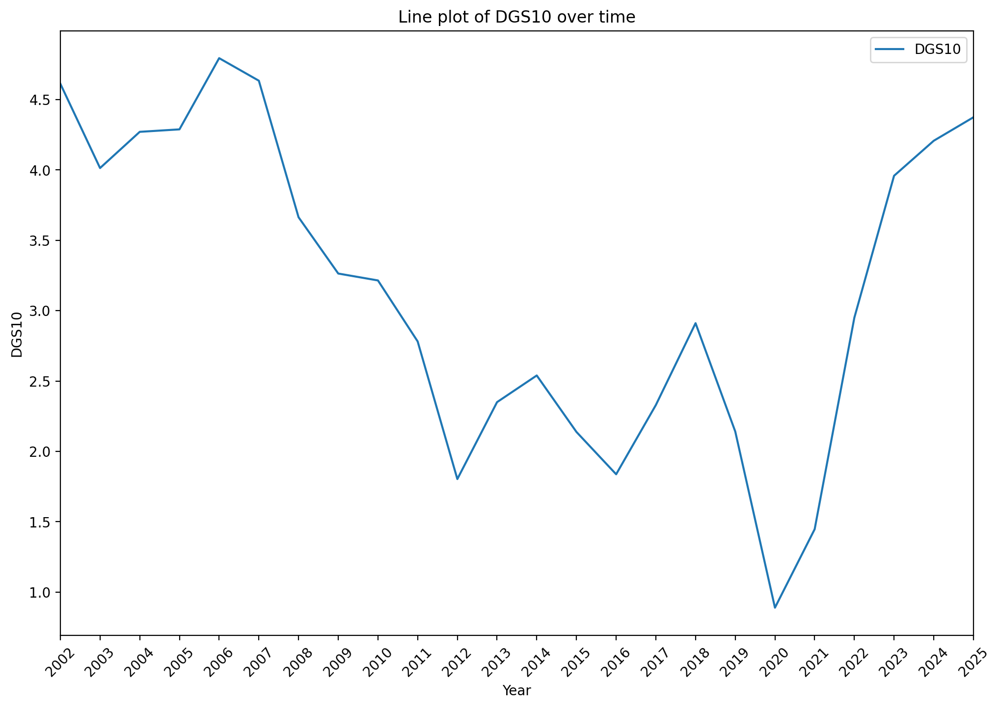

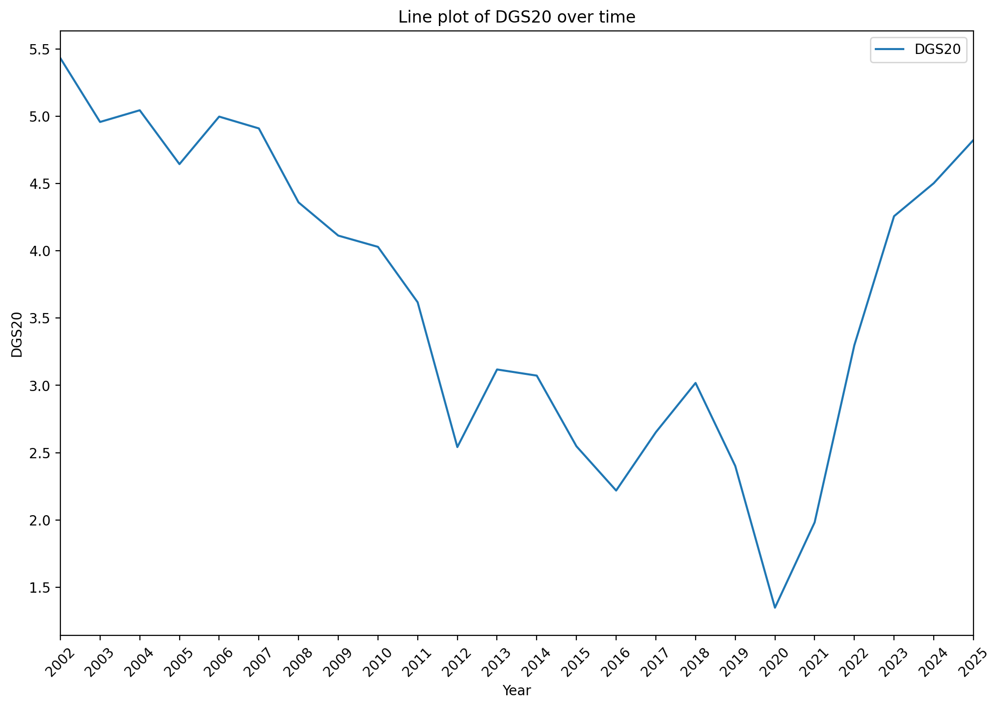

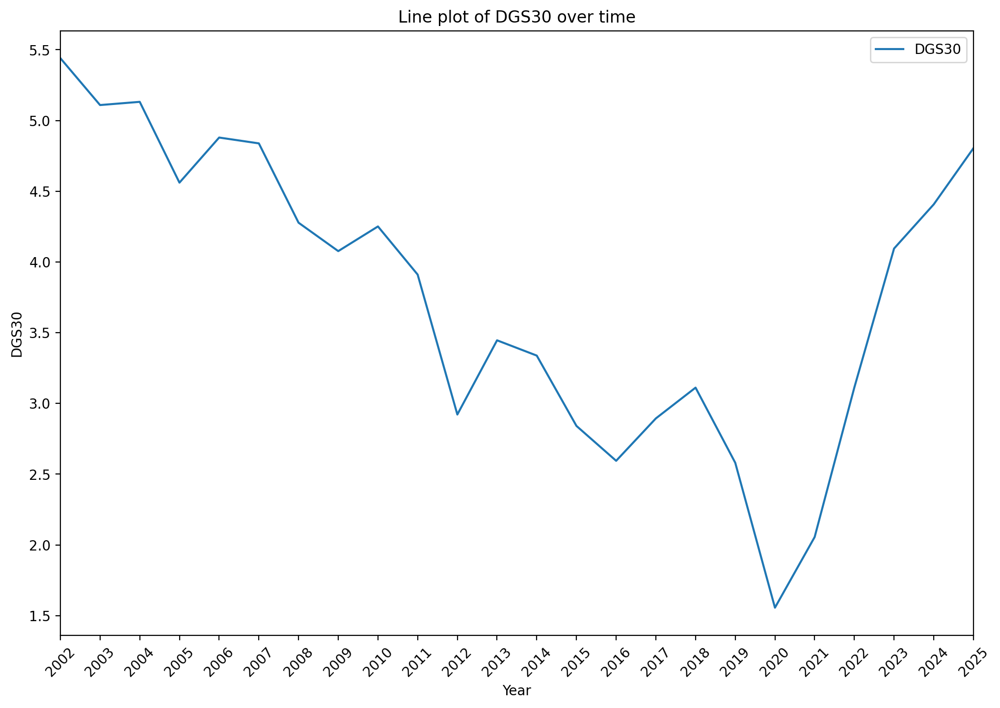

In [8]:
for c in grouped_means.columns:
    plt.figure(figsize=(12, 8), dpi = 200)
    sns.lineplot(
        data=grouped_means,
        x="year",
        y=c,
        label=c
    )
    plt.title(f"Line plot of {c} over time")
    plt.xlabel("Year")
    plt.ylabel(c)
    plt.xlim(grouped_means.index.min(), grouped_means.index.max())
    plt.legend()
    years = grouped_means.index.unique()
    plt.xticks(years, rotation=45) 
    plt.show()


/tmp/ipykernel_19807/528329726.py:10: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df_monthly_first['CPI_yoy'] = df_monthly_first['CPI'].pct_change(12) * 100


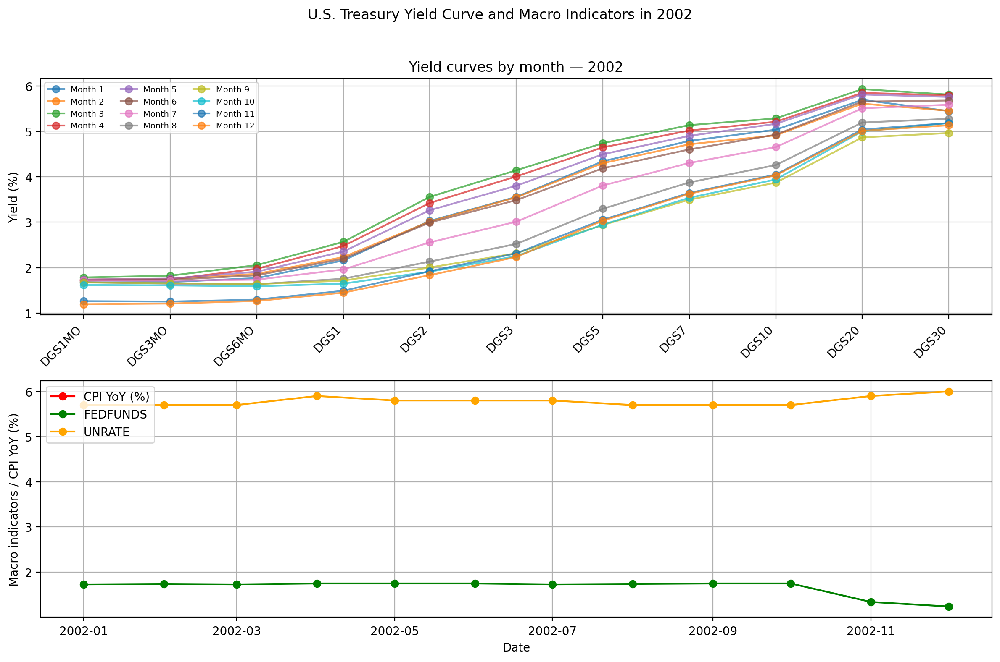

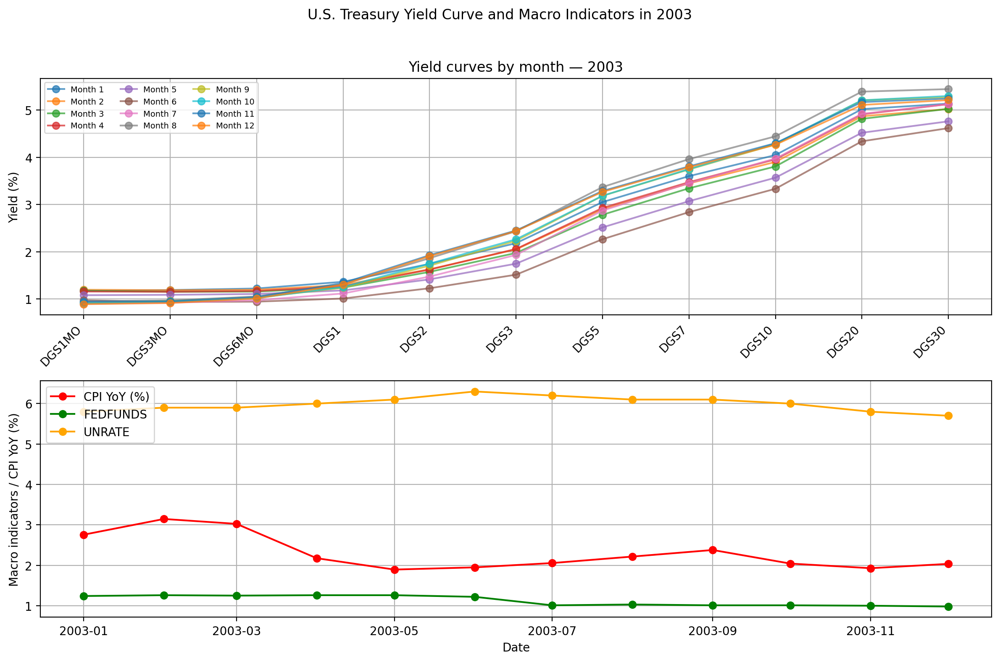

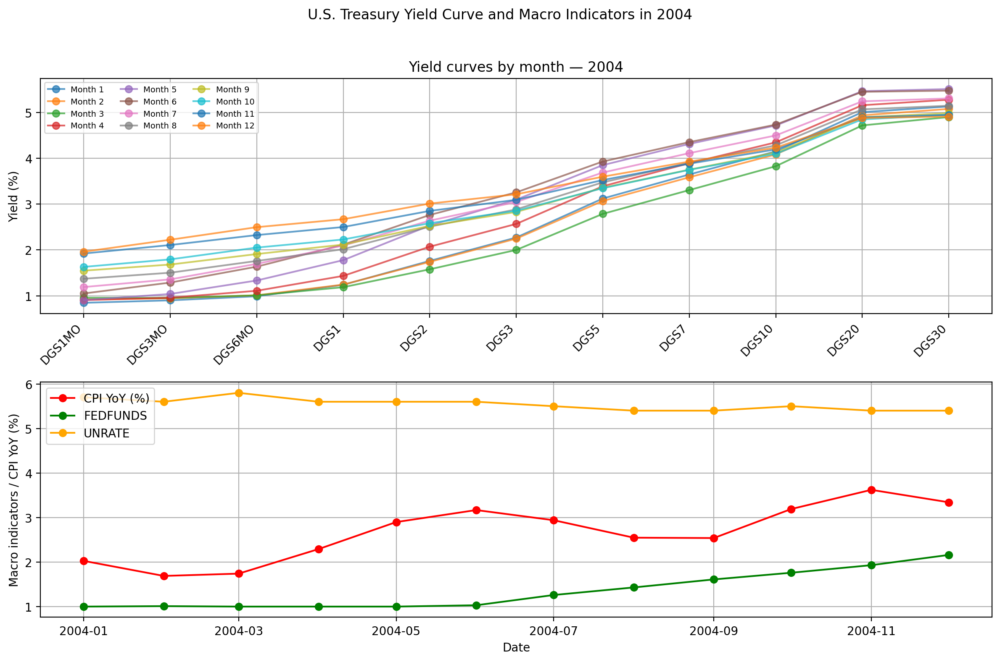

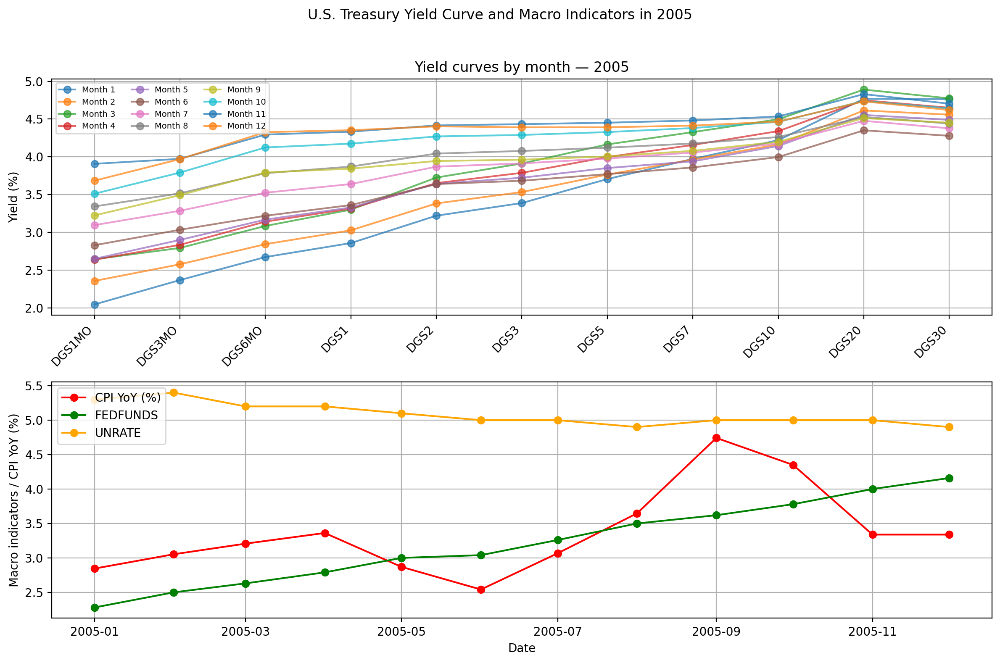

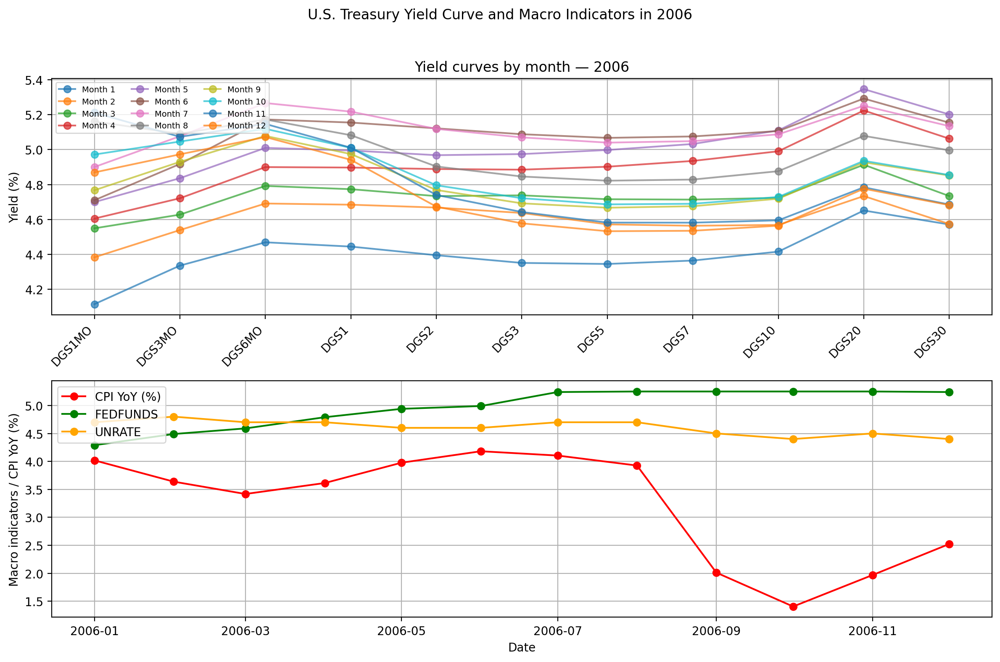

...

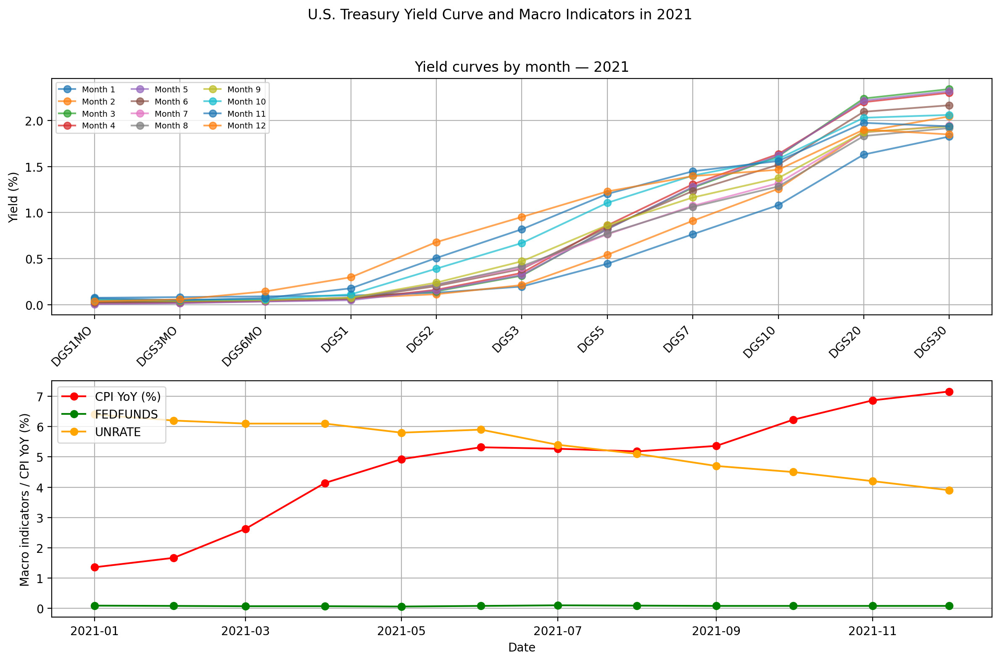

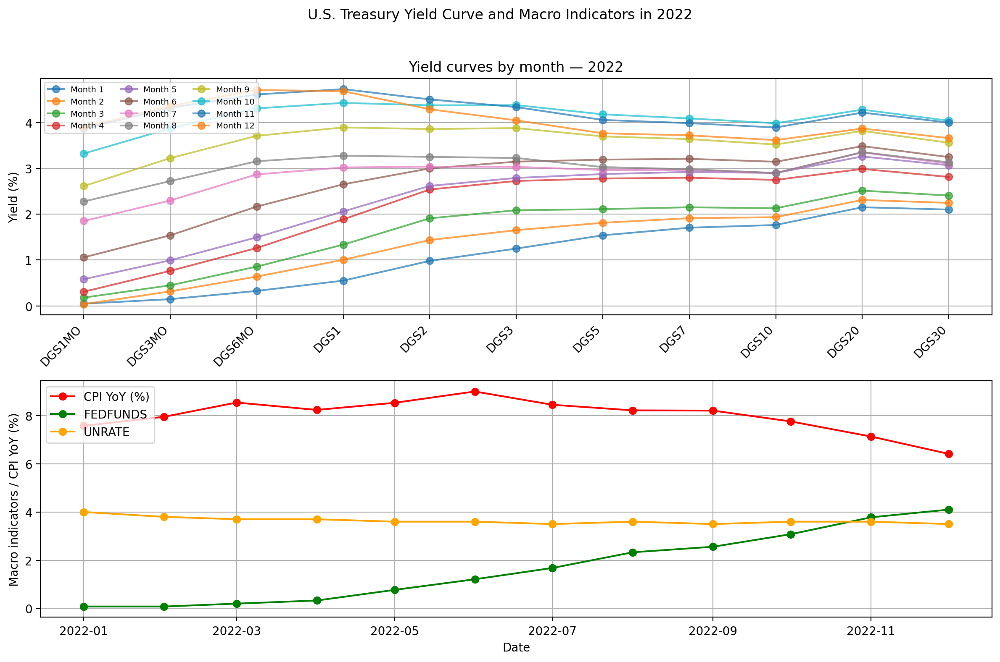

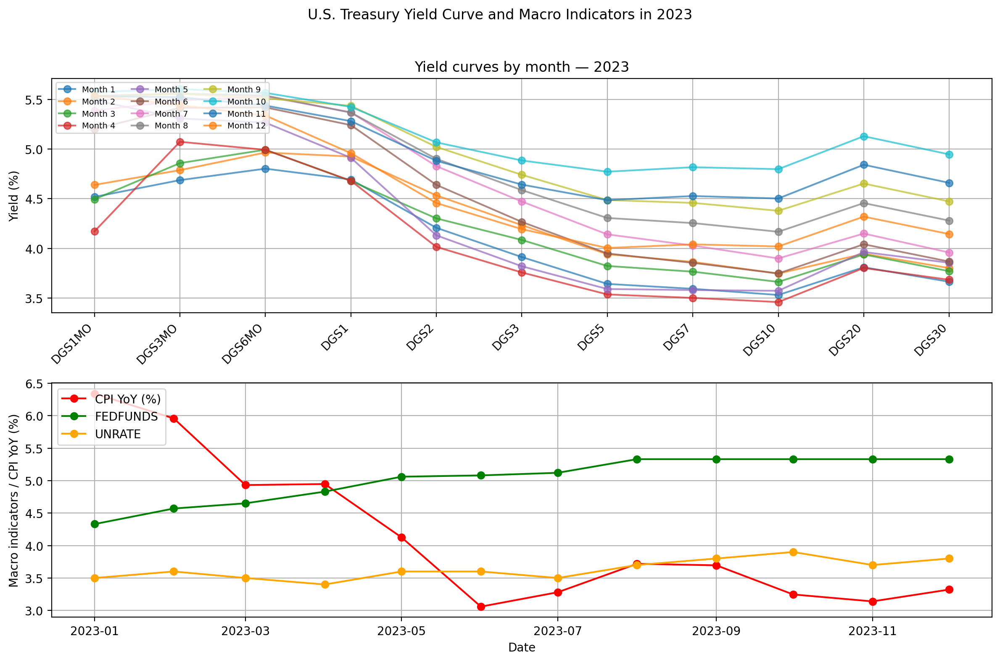

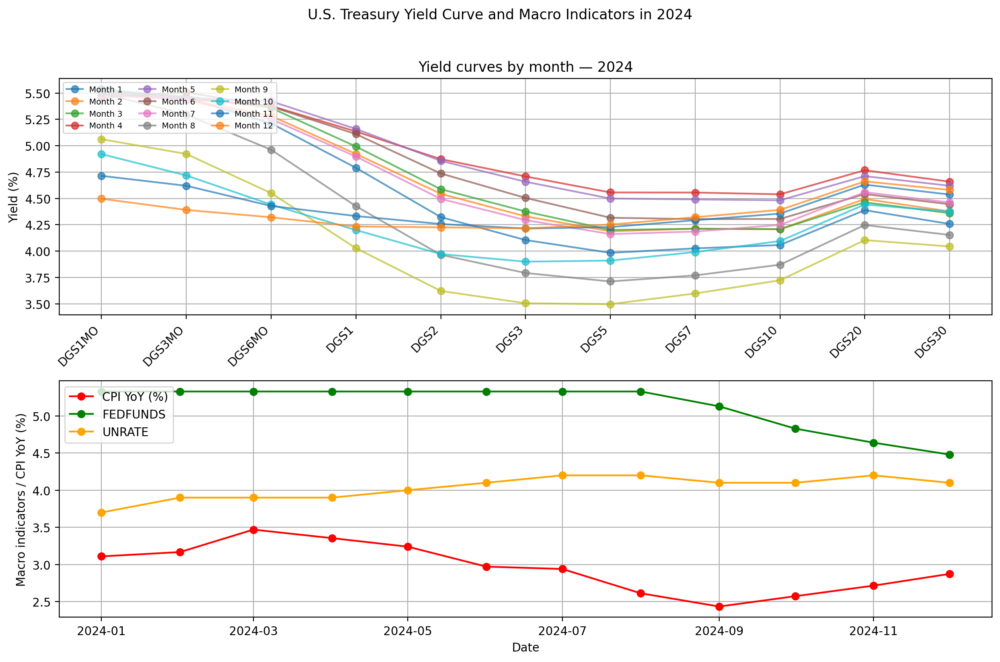

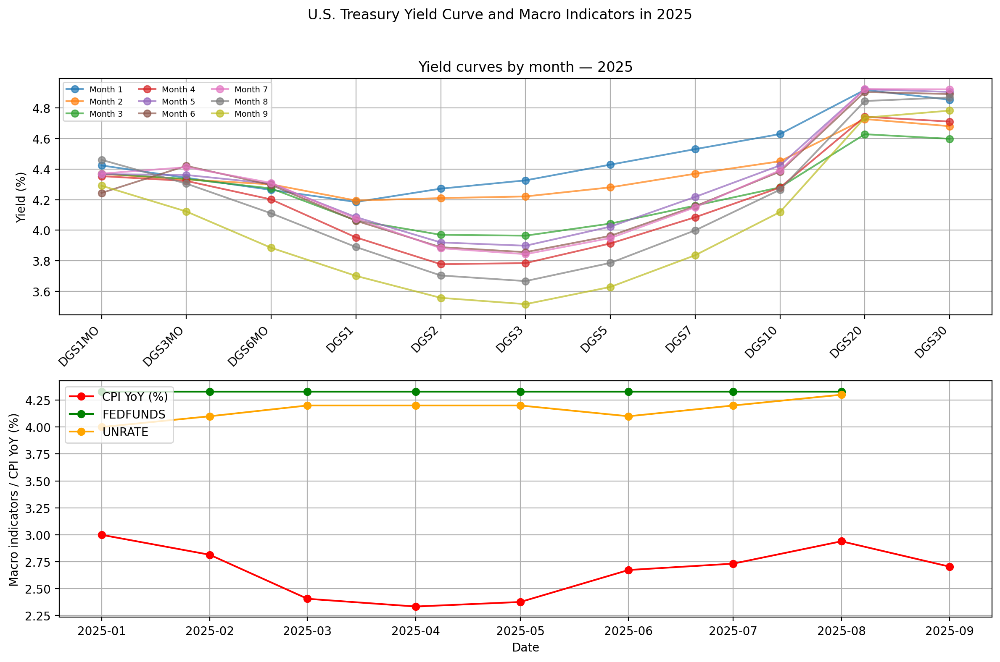

In [9]:
yield_cols = [
    "DGS1MO","DGS3MO","DGS6MO","DGS1","DGS2",
    "DGS3","DGS5","DGS7","DGS10","DGS20","DGS30"
]


# Tạo bảng "first-of-month" toàn cục (mỗi tháng giữ row đầu tiên có sẵn)
df_monthly_first = df.set_index('DATE').resample('MS').first().reset_index()
# tính CPI YoY (%) dùng dữ liệu toàn cục để có đủ 12 tháng trước nếu có
df_monthly_first['CPI_yoy'] = df_monthly_first['CPI'].pct_change(12) * 100

# --- vòng for theo năm ---
for year in sorted(df['DATE'].dt.year.unique()):
    # dữ liệu hàng ngày (dùng cho yield trung bình theo tháng)
    df_year = df[df['DATE'].dt.year == year].sort_values('DATE')
    if df_year.empty:
        continue

    # monthly mean của yield cols (index = month number)
    monthly_yield = df_year.groupby(df_year['DATE'].dt.month)[yield_cols].mean()
    if monthly_yield.empty:
        continue

    # lấy bảng first-of-month cho năm này (chỉ đầu tháng)
    df_year_monthly = df_monthly_first[df_monthly_first['DATE'].dt.year == year].copy()


    fig, (ax_yield, ax_macro) = plt.subplots(2, 1, figsize=(12,8), sharex=False, dpi = 200)

    # ---- Yield curves (categorical x) ----
    x = np.arange(len(yield_cols))
    for m in monthly_yield.index:
        row = monthly_yield.loc[m]
        if row.isna().all():
            continue
        ax_yield.plot(x, row.values, marker='o', alpha=0.7, label=f'Month {m}')
    ax_yield.set_xticks(x)
    ax_yield.set_xticklabels(yield_cols, rotation=45, ha='right')
    ax_yield.set_ylabel('Yield (%)')
    ax_yield.set_title(f'Yield curves by month — {year}')
    ax_yield.legend(fontsize=7, ncol=3, loc='upper left')
    ax_yield.grid(True)

    # ---- Macro indicators (only first-of-month) ----
    # Plot CPI as YoY% so it's comparable to FEDFUNDS / UNRATE
    if not df_year_monthly.empty:
        ax_macro.plot(df_year_monthly['DATE'], df_year_monthly['CPI_yoy'], label='CPI YoY (%)', marker='o', color='red')
        ax_macro.plot(df_year_monthly['DATE'], df_year_monthly['FEDFUNDS'], label='FEDFUNDS', marker='o', color='green')
        ax_macro.plot(df_year_monthly['DATE'], df_year_monthly['UNRATE'], label='UNRATE', marker='o', color='orange')
    else:
        print(f"⚠️ {year}: no monthly-first macro rows to plot")

    ax_macro.set_ylabel('Macro indicators / CPI YoY (%)')
    ax_macro.set_xlabel('Date')
    ax_macro.legend(loc='upper left')
    ax_macro.grid(True)

    plt.suptitle(f'U.S. Treasury Yield Curve and Macro Indicators in {year}')
    plt.tight_layout(rect=[0,0,1,0.96])
    plt.show()






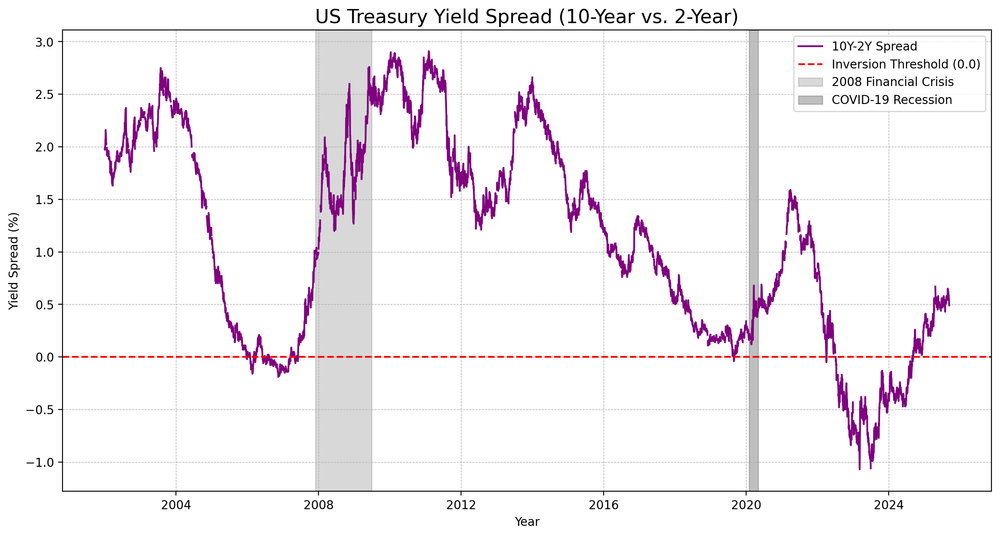

In [10]:
# --- Plot 1: Yield Spread (10-Year vs. 2-Year) ---

# Calculate the spread using the daily data for accuracy
df['SPREAD_10Y_2Y'] = df['DGS10'] - df['DGS2']

# Plotting the spread over time
plt.figure(figsize=(14, 7), dpi=200)
plt.plot(df['DATE'], df['SPREAD_10Y_2Y'], label='10Y-2Y Spread', color='purple')

# Add a horizontal line at zero to easily see inversions
plt.axhline(0, color='red', linestyle='--', linewidth=1.5, label='Inversion Threshold (0.0)')

# Highlight periods of recession (e.g., 2008 crisis, COVID-19) for context
# Note: These are approximate dates for visualization purposes
plt.axvspan('2007-12-01', '2009-06-30', color='gray', alpha=0.3, label='2008 Financial Crisis')
plt.axvspan('2020-02-01', '2020-04-30', color='gray', alpha=0.5, label='COVID-19 Recession')


plt.title('US Treasury Yield Spread (10-Year vs. 2-Year)', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Yield Spread (%)')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

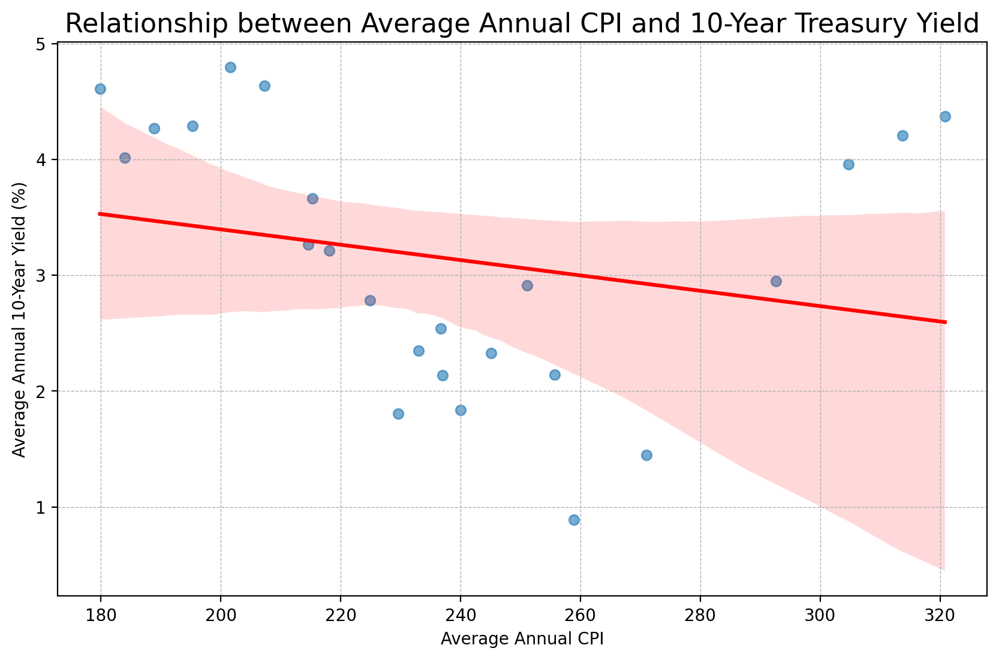

In [11]:
# --- Plot 2: Scatter Plot (CPI vs. 10-Year Yield) ---

# Use the yearly grouped data for a cleaner high-level plot
plt.figure(figsize=(10, 6), dpi=200)
sns.regplot(
    data=grouped_means,
    x='CPI',
    y='DGS10',
    scatter_kws={'alpha': 0.6},
    line_kws={'color': 'red'}
)

plt.title('Relationship between Average Annual CPI and 10-Year Treasury Yield', fontsize=16)
plt.xlabel('Average Annual CPI')
plt.ylabel('Average Annual 10-Year Yield (%)')
plt.grid(True, linestyle='--', linewidth=0.5)
plt.show()

/tmp/ipykernel_19807/847533529.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


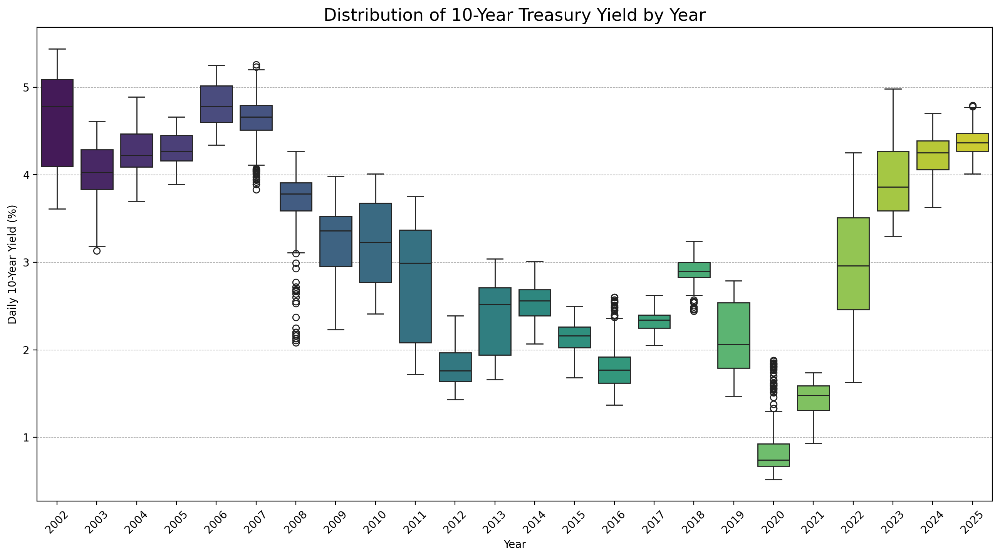

In [12]:
# --- Plot 3: Box Plot of 10-Year Yield by Year ---

plt.figure(figsize=(16, 8), dpi=200)
sns.boxplot(
    data=df,
    x='year',
    y='DGS10',
    palette='viridis'
)

plt.title('Distribution of 10-Year Treasury Yield by Year', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Daily 10-Year Yield (%)')
plt.xticks(rotation=45)
plt.grid(True, axis='y', linestyle='--', linewidth=0.5)
plt.show()

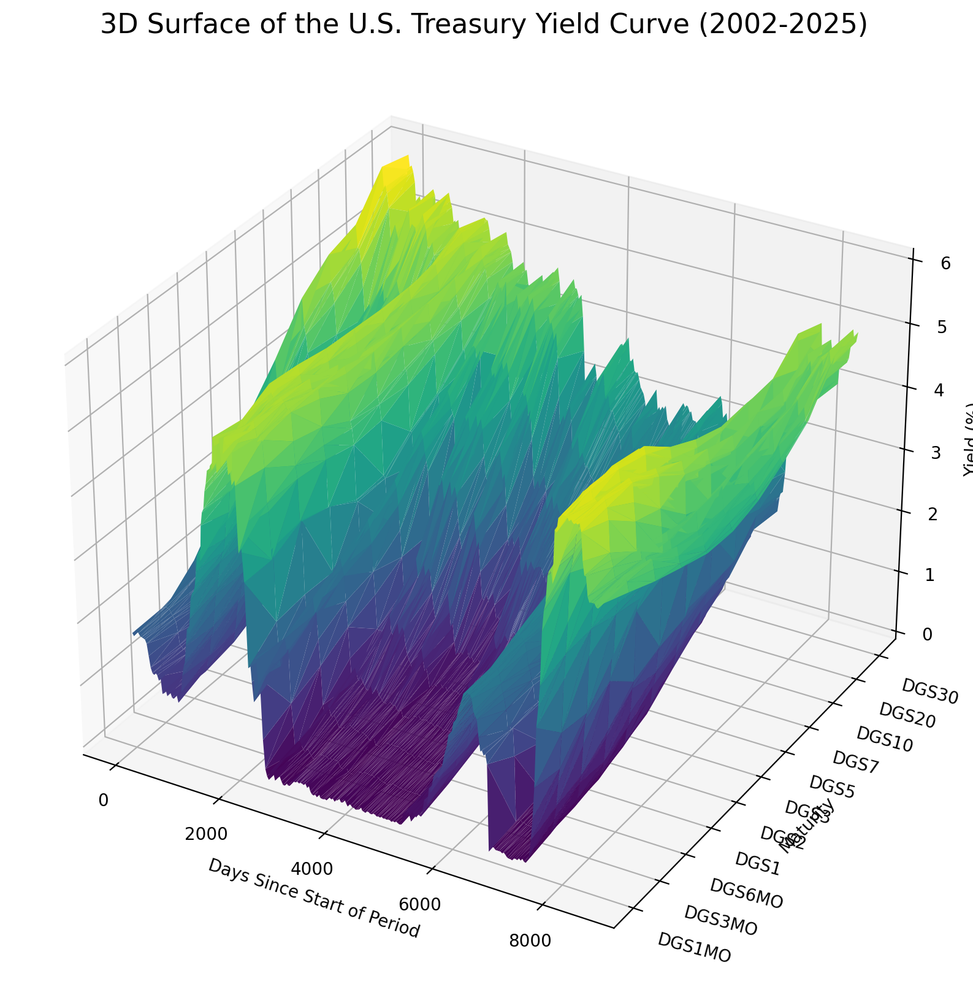

In [19]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

# --- Plot 4: 3D Surface of the Yield Curve ---

# We need to restructure the data from "wide" to "long" format
yield_cols = ["DGS1MO", "DGS3MO", "DGS6MO", "DGS1", "DGS2", "DGS3", "DGS5", "DGS7", "DGS10", "DGS20", "DGS30"]
df_yields = df[['DATE'] + yield_cols]

# For performance, let's resample to the first day of each month
df_monthly = df_yields.set_index('DATE').resample('MS').first().dropna()
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

# --- Plot 4: 3D Surface of the Yield Curve ---

# We need to restructure the data from "wide" to "long" format
yield_cols = ["DGS1MO", "DGS3MO", "DGS6MO", "DGS1", "DGS2", "DGS3", "DGS5", "DGS7", "DGS10", "DGS20", "DGS30"]
df_yields = df[['DATE'] + yield_cols]

# For performance, let's resample to the first day of each month
df_monthly = df_yields.set_index('DATE').resample('MS').first().dropna()

# Melt the dataframe
df_long = df_monthly.reset_index().melt(id_vars='DATE', var_name='Maturity', value_name='Yield')

# Create numeric representations for date and maturity
df_long['DateNum'] = (df_long['DATE'] - df_long['DATE'].min()).dt.days
maturity_map = {name: i for i, name in enumerate(yield_cols)}
df_long['MaturityNum'] = df_long['Maturity'].map(maturity_map)

# Create the 3D plot
fig = plt.figure(figsize=(15, 10), dpi=200)
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_trisurf(
    df_long['DateNum'],
    df_long['MaturityNum'],
    df_long['Yield'],
    cmap=cm.viridis, # Use a nice colormap
    linewidth=0.2
)

ax.set_title('3D Surface of the U.S. Treasury Yield Curve (2002-2025)', fontsize=16)
ax.set_xlabel('Days Since Start of Period')
ax.set_ylabel('Maturity')
ax.set_zlabel('Yield (%)')

# Set the Y-axis ticks to be the actual maturity names
ax.set_yticks(range(len(yield_cols)))
ax.set_yticklabels(yield_cols, rotation= -15, ha= 'left')

plt.show()